# **OP-21 Exploratory Data Analysis**

# Setup
### Libraries

In [2]:
# Extra repository for the Rgraphviz package
install.packages("BiocManager")
BiocManager::install("Rgraphviz")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

'getOption("repos")' replaces Bioconductor standard repositories, see
'?repositories' for details

replacement repositories:
    CRAN: https://cran.r-project.org


Bioconductor version 3.12 (BiocManager 1.30.19), R 4.0.0 (2020-04-24)

Installing package(s) 'BiocVersion', 'Rgraphviz'

also installing the dependencies ‘BiocGenerics’, ‘graph’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Old packages: 'bit', 'brew', 'broom', 'callr', 'cli', 'commonmark', 'cpp11',
  'crayon', 'curl', 'data.table', 'devtools', 'dials', 'digest', 'DT', 'e1071',
  'evaluate', 'forecast', 'fracdiff', 'future', 'future.apply', 'ggplot2',
  'globals', 'haven', 'hexbin', 'htmltools', 'htmlwidgets', 'httpuv', 'infer',
  'IRkernel', 'isoband', 'jsonlite', 'KernSmooth', 'knitr', 'later', 'lava',
  'lhs', 'lifecycle', 'listenv', 'lmtest', 'lubridate', 'Matrix', 'mgcv',
  'modelr', 'nlme', 'nnet', 'ope

In [1]:
install.packages(
    c("psych",
      "ggridges"), dependencies = TRUE)

also installing the dependencies ‘nloptr’, ‘psychTools’, ‘lavaan’, ‘lme4’, ‘vdiffr’


Warning message in install.packages(c("psych", "ggridges"), dependencies = TRUE):
“installation of package ‘nloptr’ had non-zero exit status”
Warning message in install.packages(c("psych", "ggridges"), dependencies = TRUE):
“installation of package ‘vdiffr’ had non-zero exit status”
Warning message in install.packages(c("psych", "ggridges"), dependencies = TRUE):
“installation of package ‘lme4’ had non-zero exit status”
Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [3]:
# Libraries
library(tidyverse)
library(zoo)
library(magrittr)
library(repr)
library(IRdisplay)
library(psych)
library(reshape2)
library(ggridges)
library(forcats)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.6      ✔ purrr   0.3.4 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.1 
✔ readr   2.1.2      ✔ forcats 0.5.2 

Warning message:
“package ‘ggplot2’ was built under R version 4.0.5”
Warning message:
“package ‘tibble’ was built under R version 4.0.5”
Warning message:
“package ‘tidyr’ was built under R version 4.0.5”
Warning message:
“package ‘readr’ was built under R version 4.0.5”
Warning message:
“package ‘purrr’ was built under R version 4.0.3”
Warning message:
“package ‘dplyr’ was built under R version 4.0.5”
Warning message:
“package ‘stringr’ was built under R version 4.0.5”
Warning message:
“package ‘forcats’ was built under R version 4.0.5”
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Warning message:
“package ‘zoo’ was built under R version 4.0.5

### Load Data

In [4]:
# Load data
measure.dataset.csv.path <- '../../data/OP-21.csv'
measure.data <- read.csv(measure.dataset.csv.path)
measure.data

provider_id,score,lag1,lag2,year,quarter,lag_diff,prov_mean,prov_mean_diff
<int>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>
100001,84,NA,NA,2014,1,NA,NA,NA
100001,80,84,NA,2014,2,-4,84.00000,-4.000000
100001,75,80,84,2014,3,-5,82.00000,-7.000000
100001,73,75,80,2015,1,-2,79.66667,-6.666667
100001,69,73,75,2015,2,-4,78.00000,-9.000000
100001,71,69,73,2015,3,2,76.20000,-5.200000
100001,70,71,69,2015,4,-1,75.33333,-5.333333
100001,64,70,71,2016,1,-6,74.57143,-10.571429
100001,63,64,70,2016,3,-1,73.25000,-10.250000


# Summary Statistics

The OP-21 dataset contains 42370 observations and ranges from 2017Q3 to 2021Q3 with relatively consistent reporting quantities. The median OP-22 score is 57. The lower 10th percentile is 31, and the upper 90th percentile is 79. Half of all OP-22 data lies between the range of 43 and 69. Historically, there was a slight drift upwards in the median score until 2019, when the OP-22 scores stabilized. 

In [5]:
measure.data %>% nrow()

[1] 50658

In [6]:
measure.data %$% score %>% describe(., quant = c(0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.99))

vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se,Q0.01,Q0.1,Q0.25,Q0.5,Q0.75,Q0.9,Q0.99
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,50658,52.69499,17.71452,51,51.61858,16.3086,5,262,257,0.8602062,2.404154,0.07870553,21,32,40,51,63,75,104


In [7]:
measure.data$y_quarter <- as.yearqtr(paste0(measure.data$year,'Q',measure.data$quarter))

In [8]:
table(measure.data$y_quarter)


2014 Q1 2014 Q2 2014 Q3 2015 Q1 2015 Q2 2015 Q3 2015 Q4 2016 Q1 2016 Q3 2016 Q4 
   3160    3169    3160    3180    3206    3182    3301    3409    3517    3522 
2017 Q1 2017 Q2 2017 Q3 2017 Q4 2018 Q1 
   3537    3560    3578    3587    3590 

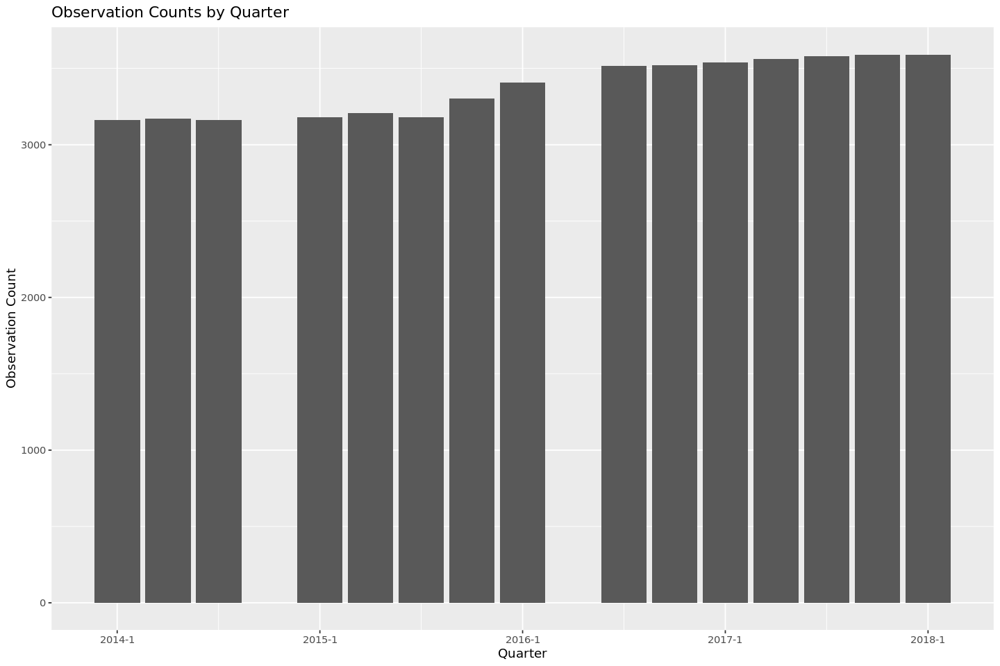

In [9]:
# Change plot size to 12 x 8
options(repr.plot.width=12, repr.plot.height=8)

measure.data %>%
    ggplot(aes(x = y_quarter)) +
    geom_bar() +
    xlab("Quarter") +
    ylab("Observation Count") +
    ggtitle("Observation Counts by Quarter")

In [5]:
measure.data %>%
    ggplot(aes(x = y_quarter, y = score, group = y_quarter)) +
    ylab("Score") +
    xlab("Quarter") +
    geom_boxplot(fill = "#00BFC4")+
    ggtitle("OP-21 Score Distribution by Quarter")

ERROR: Error in measure.data %>% ggplot(aes(x = y_quarter, y = score, group = y_quarter)): could not find function "%>%"


### Provider Analysis

The OP-22 dataset contains 3320 unique providers. Most providers have 14 quarters of data. 3027 providers had 8 or more quarters of data and were thus included in the ACF Time Series Analysis.

In [11]:
measure.data %$% provider_id %>% n_distinct()

[1] 3826

In [12]:
provider.counts <- 
    measure.data %>%
    arrange(provider_id, y_quarter) %>%
    group_by(provider_id) %>%
    count() %>%
    rename(provider.n = n) %>% 
    arrange(-provider.n) 

provider.counts %>% head()

provider_id,provider.n
<int>,<int>
101,15
113,15
501,15
503,15
601,15
1002,15


,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se,Q0.1,Q0.25,Q0.75,Q0.9
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
provider_id,1,3826,243820.80476,1.659587e+05,231306,237476.55389,205794.5,101,670124,670023,0.2554817,-1.012000,2.683043e+03,34003.5,100117.2,380051.8,451386.5
n,2,3826,13.24046,3.636517e+00,15,14.16231,0.0,1,15,14,-1.9490969,2.515345,5.879131e-02,7.0,15.0,15.0,15.0


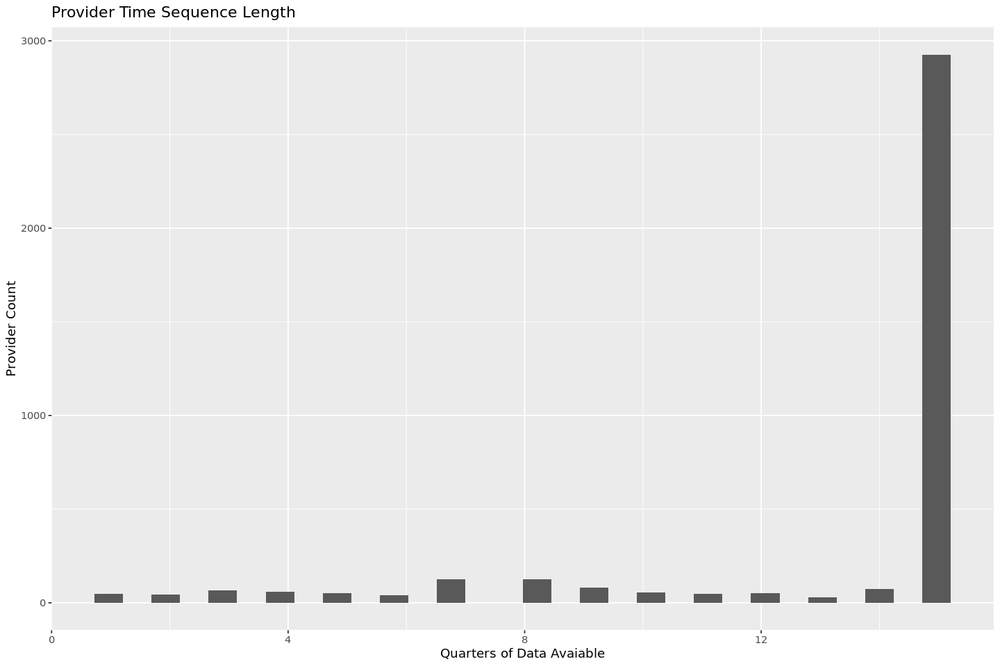

In [13]:
measure.data %>%
    arrange(provider_id,y_quarter) %>%
    count(provider_id) %T>% 
        {describe(., quant = c(.1,.25,.75,.9)) %>% display()} %>%
    ggplot(aes(n)) +
    xlab("Quarters of Data Avaiable") + 
    ylab("Provider Count") + 
    geom_histogram(bins =30) +
    ggtitle("Provider Time Sequence Length")

In [14]:
measure.data.filtered <- measure.data %>%
    arrange(provider_id,y_quarter) %>%
    group_by(provider_id) %>%
    filter(n() >= 8)

In [15]:
measure.data.filtered %$% provider_id %>% n_distinct()

[1] 3389

# Time Series Analysis

### Provider Level ACF Plots
From the handful of plot below, we see some evidence of autocorrelation among lags one and two. A ridge plot willl be applied to test this trend more broadly across all providers.

In [16]:
measure.data.filtered 
    select(provider_id, score) %>%

ERROR: Error in parse(text = x, srcfile = src): <text>:3:0: unexpected end of input
1: measure.data.filtered 
2:     select(provider_id, score) %>%
  ^


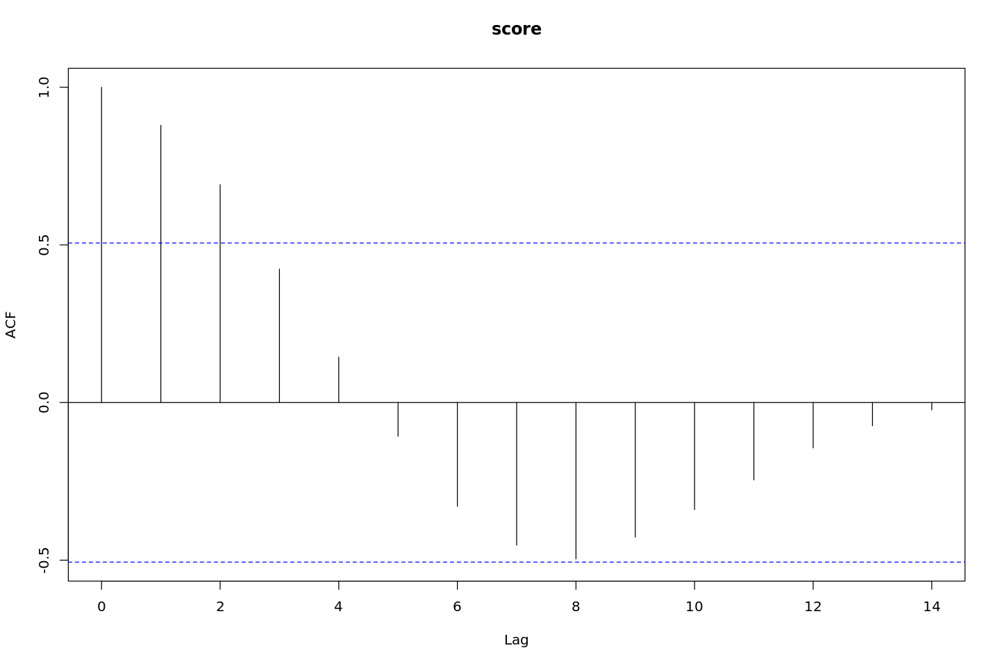

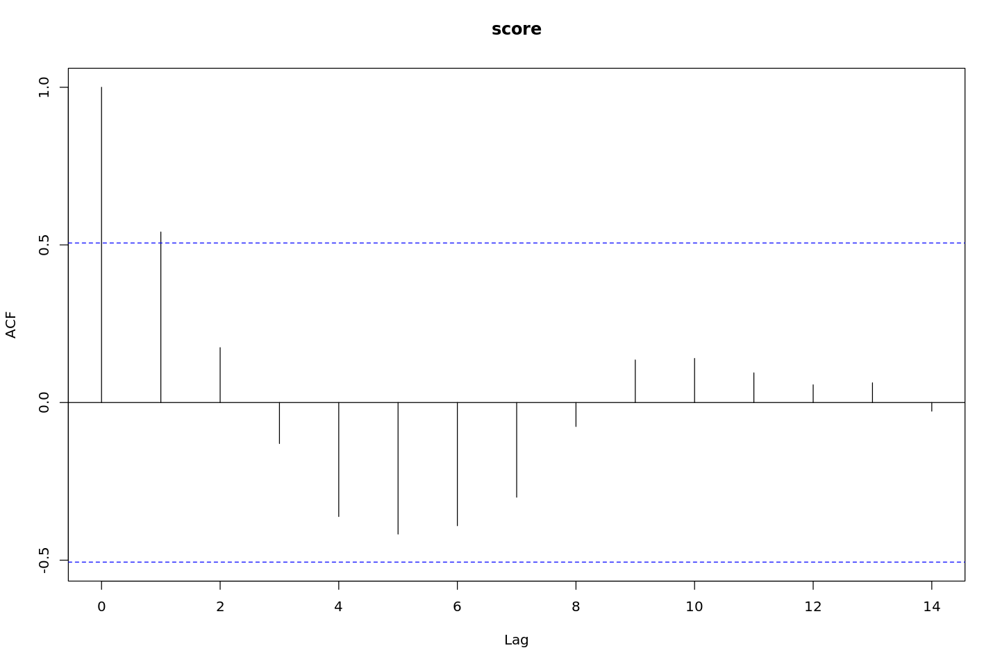

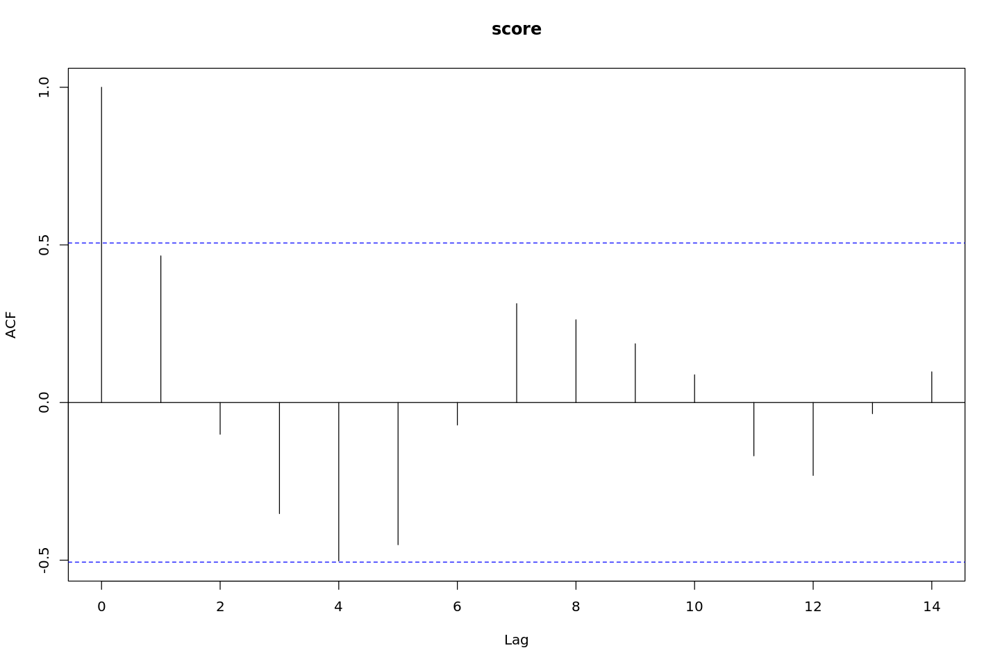

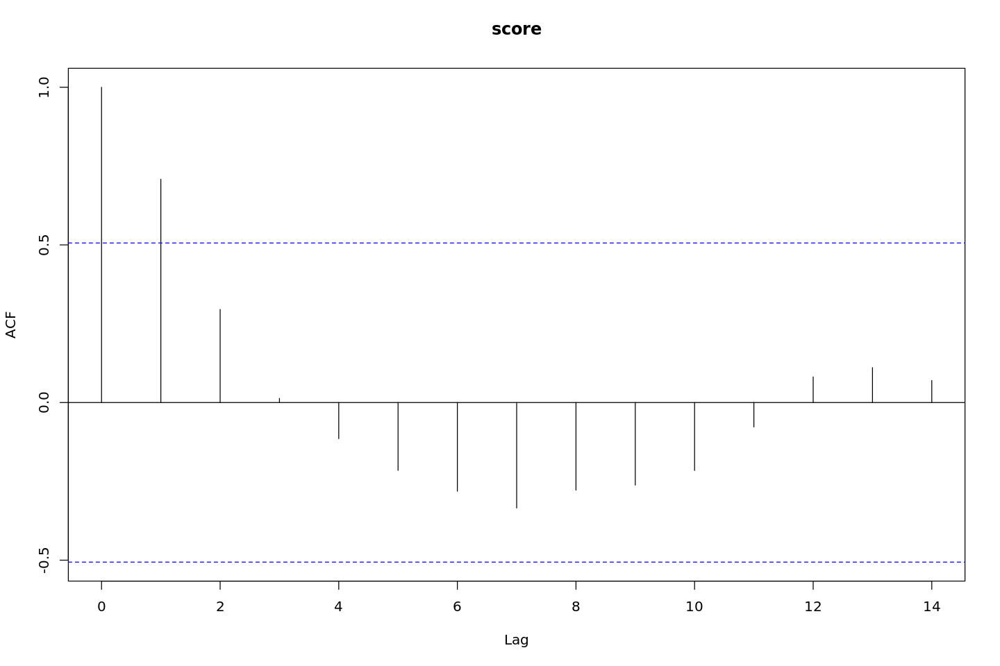

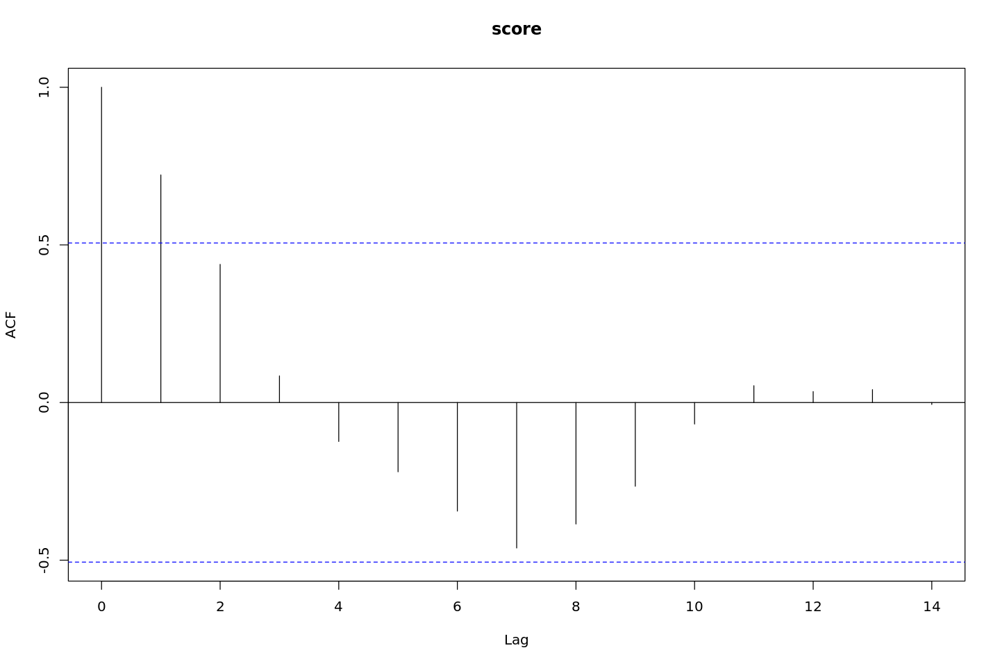

...

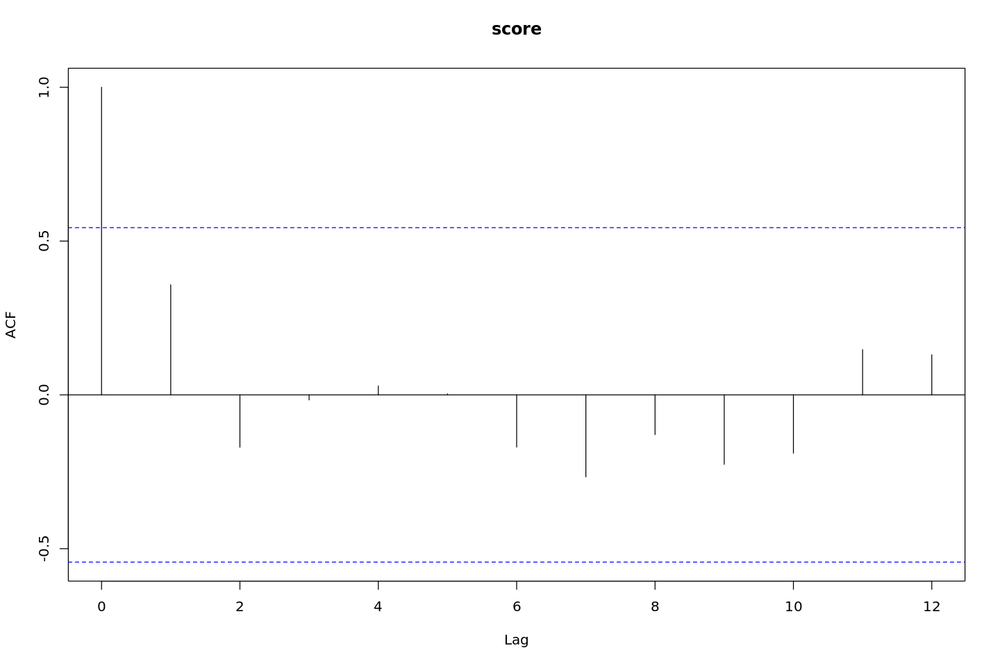

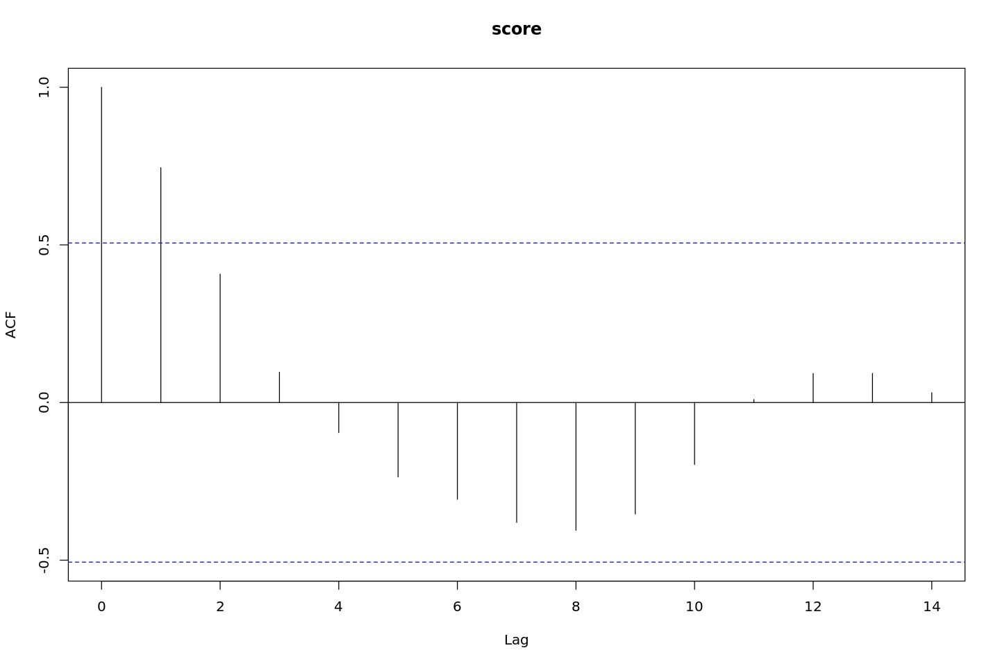

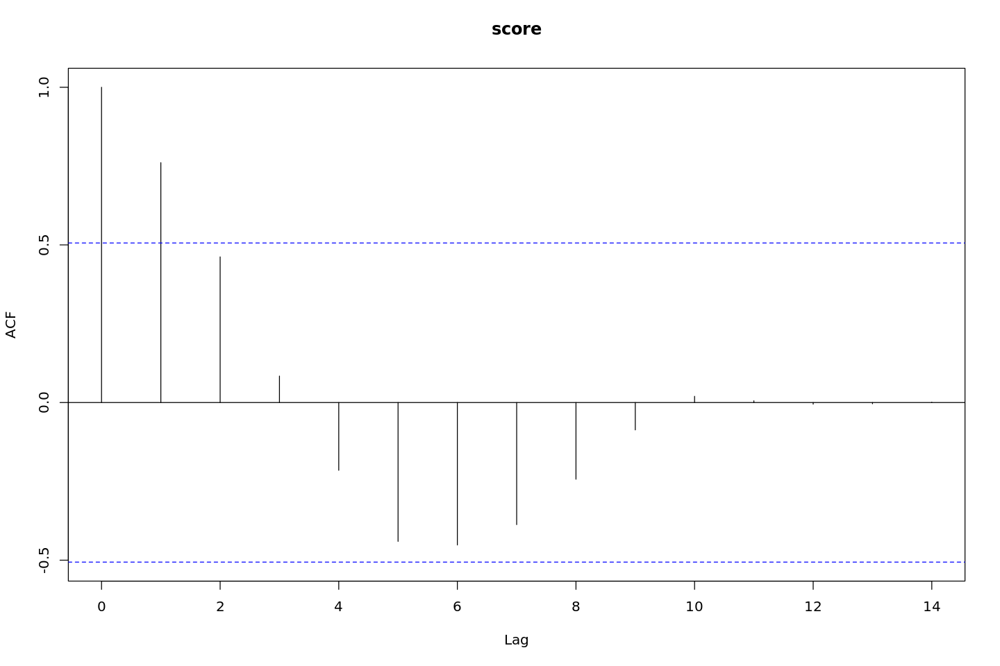

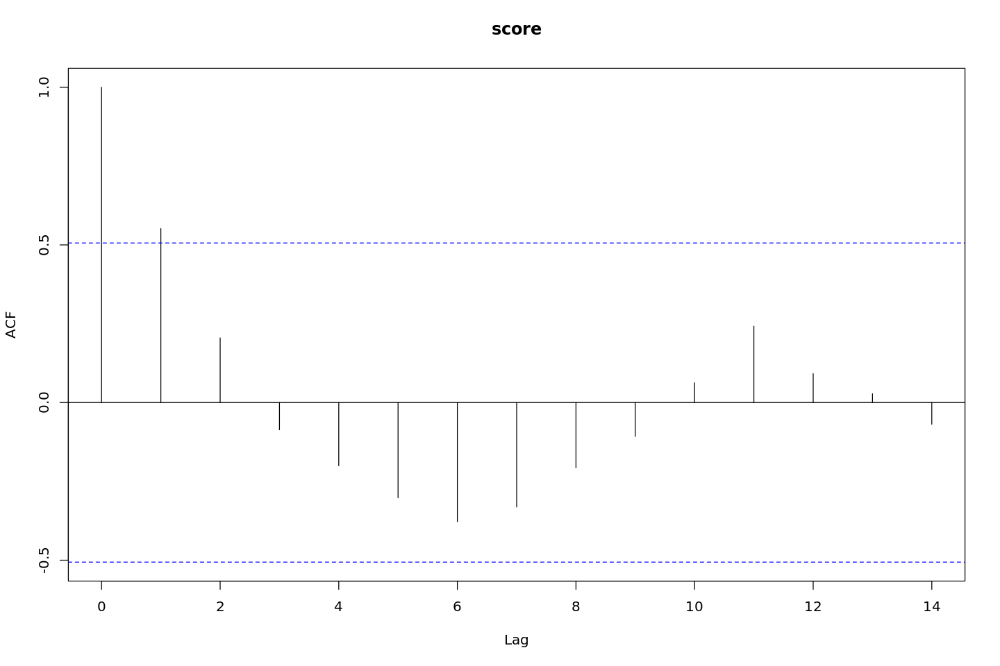

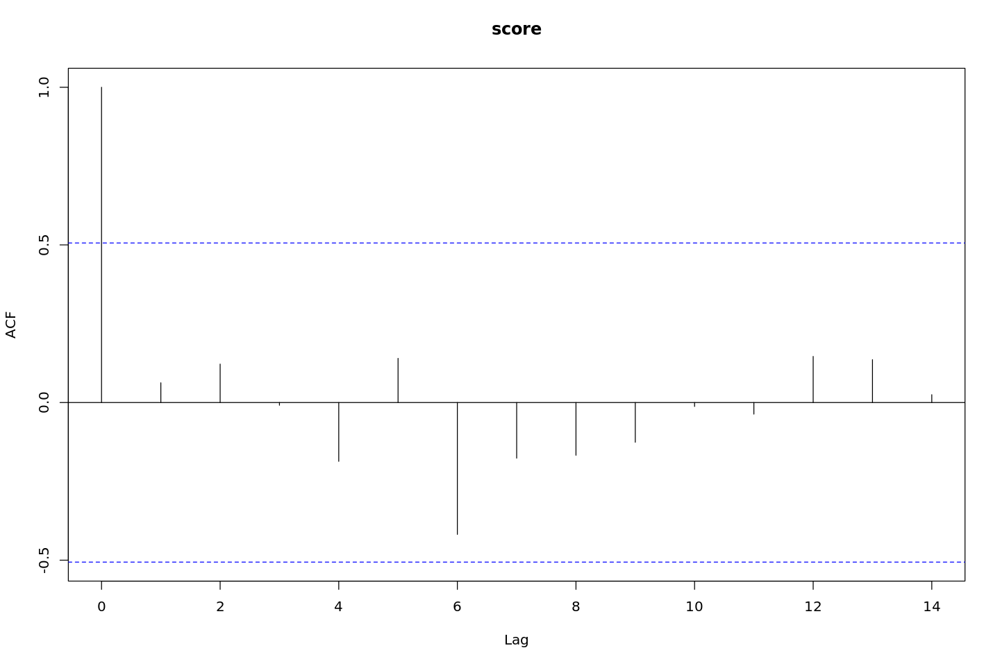

[[1]]

Autocorrelations of series ‘dots[[1L]][[1L]]’, by lag

     0      1      2      3      4      5      6      7      8      9     10 
 1.000  0.879  0.691  0.423  0.144 -0.107 -0.329 -0.452 -0.496 -0.427 -0.340 
    11     12     13     14 
-0.245 -0.144 -0.074 -0.023 

[[2]]

Autocorrelations of series ‘dots[[1L]][[2L]]’, by lag

     0      1      2      3      4      5      6      7      8      9     10 
 1.000  0.541  0.174 -0.130 -0.362 -0.417 -0.391 -0.300 -0.076  0.135  0.140 
    11     12     13     14 
 0.094  0.056  0.063 -0.027 

[[3]]

Autocorrelations of series ‘dots[[1L]][[3L]]’, by lag

     0      1      2      3      4      5      6      7      8      9     10 
 1.000  0.465 -0.101 -0.352 -0.503 -0.451 -0.071  0.314  0.263  0.186  0.088 
    11     12     13     14 
-0.169 -0.231 -0.035  0.097 

[[4]]

Autocorrelations of series ‘dots[[1L]][[4L]]’, by lag

     0      1      2      3      4      5      6      7      8      9     10 
 1.000  0.708  0.295  0.013 -

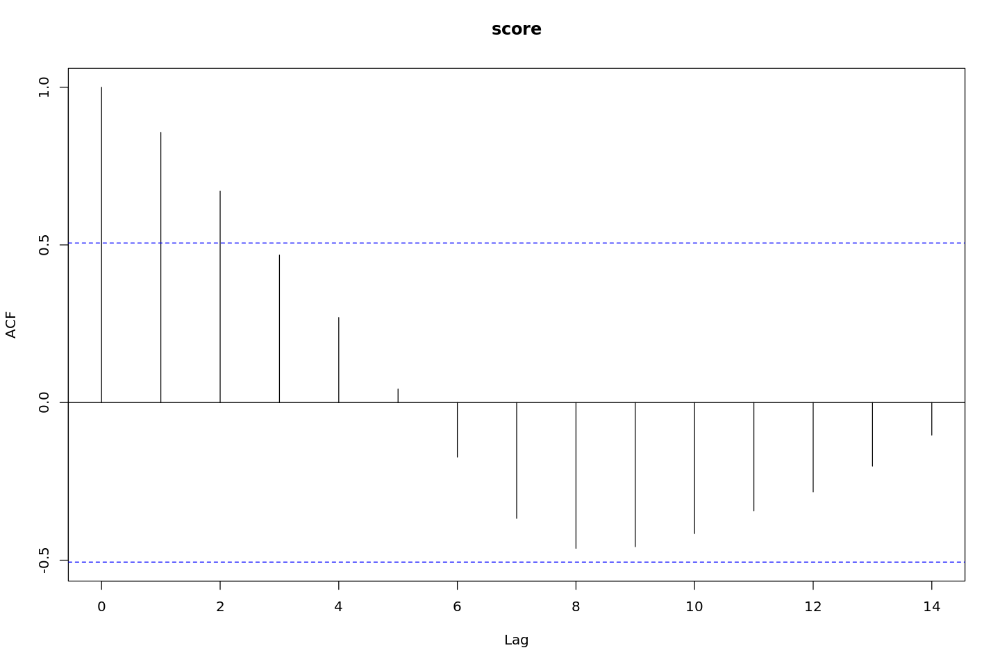

In [17]:
#ACF quick visual
measure.data.filtered %>%
    select(provider_id, score) %>%
    mutate(provider_id = as.integer(provider_id)) %>%
    filter(provider_id < 100021) %>%
    group_by(provider_id) %>%
    group_map(acf, na.action= na.exclude)

### ACF Value Matrix

In [18]:
ac_scores <- 
    measure.data.filtered %>%
    select(provider_id, score) %>%
    mutate(provider_id = as.integer(provider_id)) %>%
    group_by(provider_id)%>%
    group_map(acf, plot = FALSE, na.action= na.exclude)

unlisted <- ac_scores %>% unlist(recursive = FALSE)

acfs <- unlisted[names(unlisted) == "acf"]

acf.matrix <- acfs %>% 
    lapply(head, 8) %>% 
    do.call(rbind, .)

In [19]:
colnames(acf.matrix) <- paste("Lag", 0:7)

In [20]:
acf.matrix %>% head()

,Lag 0,Lag 1,Lag 2,Lag 3,Lag 4,Lag 5,Lag 6,Lag 7
acf,1,0.8790399,0.6910834,0.4233555,0.1438262,-0.106706410,-0.32921567,-0.4523251
acf,1,0.5409614,0.1741981,-0.1299499,-0.3615959,-0.417259865,-0.39066702,-0.3002724
acf,1,0.4651748,-0.1006178,-0.3522152,-0.5025467,-0.451024714,-0.07129295,0.3136377
acf,1,0.7082603,0.2953612,0.0132414,-0.1144793,-0.215205879,-0.28141426,-0.3346286
acf,1,0.7219697,0.4382576,0.0844697,-0.1234848,-0.219696970,-0.34431818,-0.4613636
acf,1,0.8203183,0.6731068,0.4108841,0.2207836,-0.003607796,-0.12057455,-0.2631331


### Ridgeline Plot 

Looking at all providers confirms this trend on a broader scale- there is a significant correlation between many providers' current score and their past two previous scores (lag 1 and lag 2). Lag 1 and Lag 2 should therefore be included in the model features. 

Picking joint bandwidth of 0.033



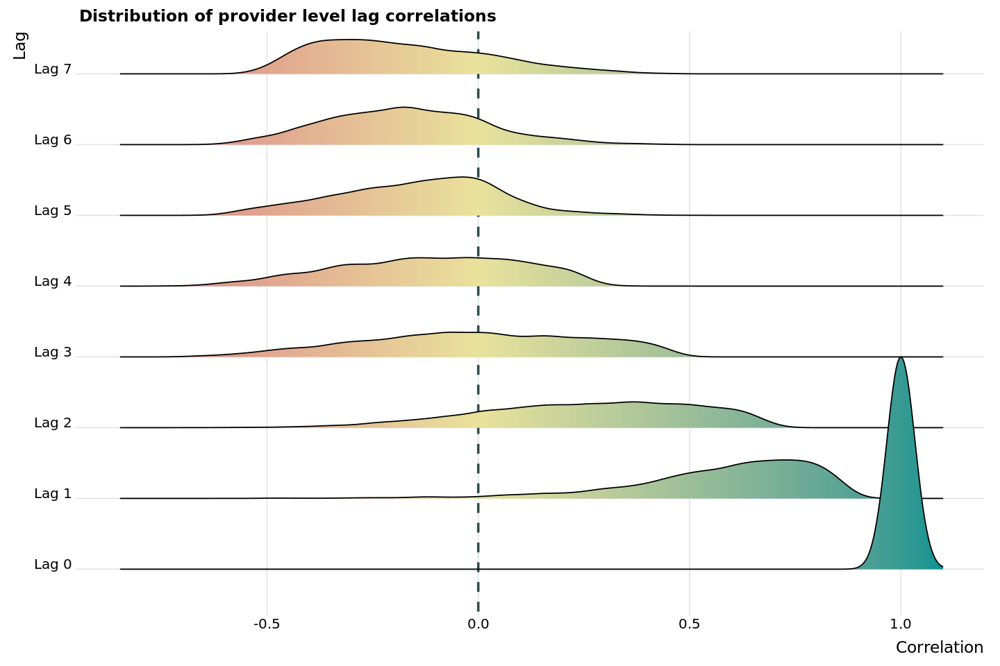

In [21]:
options(repr.plot.width=12, repr.plot.height=8)
acf.matrix %>% 
    as.data.frame() %>% 
    gather(Lag, Correlation) %>%
    mutate(Lag = as.factor(Lag)) %>%
    mutate(Lag = fct_relevel(Lag, paste("Lag",0:7))) %>%
    ggplot(aes(x = Correlation, y = Lag, fill = ..x..)) + 
        geom_vline(
            xintercept=0, 
            color = "darkslategrey", 
            linetype = 'dashed', 
            size = 1) +
        geom_density_ridges_gradient(scale = 3, alpha = 0.2) +
        scale_fill_gradient2(
            low = "#cf597e",
            mid = "#e9e29c",
            high = "#009392",
            space = "Lab",
            na.value = "grey50",
            guide = "colourbar",
            aesthetics = "fill") + 
        theme_ridges() + 
        ggtitle("Distribution of provider level lag correlations") +
        theme(legend.position = "none")
